In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import math
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [2]:
DBD = pd.read_excel('Dry_Bean_Dataset.xlsx')

In [3]:
DBD.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [4]:
EDA_DBD = DBD.copy()

In [5]:
#Labelling and Coding
DBD.Class.replace(('SEKER', 'BARBUNYA','BOMBAY','CALI','DERMASON','HOROZ','SIRA'), (0,1,2,3,4,5,6), inplace=True)

In [6]:
DBD['Class'].value_counts()

Class
4    3546
6    2636
0    2027
5    1928
3    1630
1    1322
2     522
Name: count, dtype: int64

In [7]:
DBD.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

In [8]:
DBD.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,0
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,0
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,0
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,0
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,0


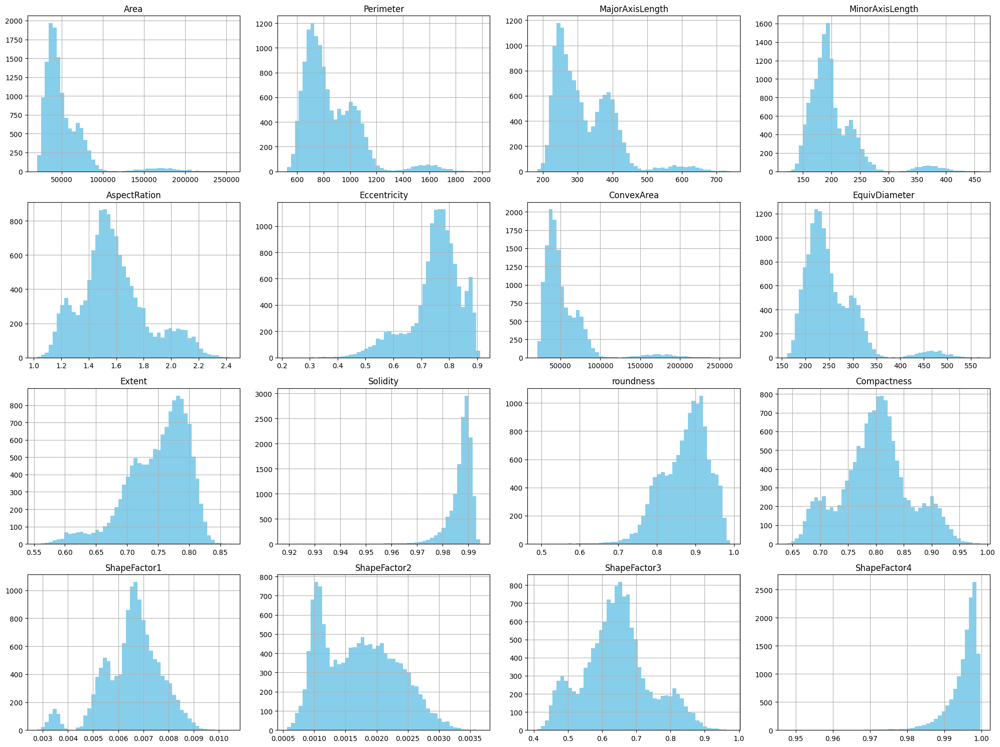

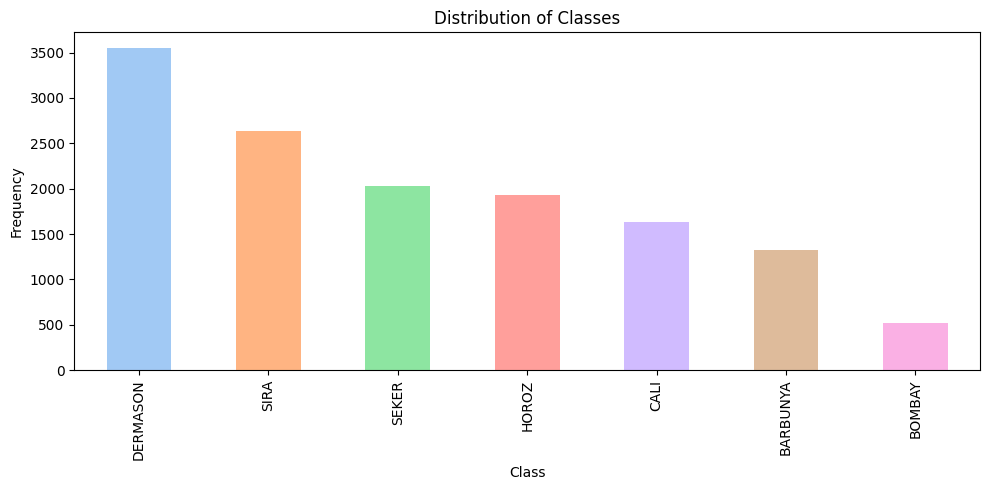

In [9]:

sns.set_palette("husl")             #color palette

# Histograms for numerical features
EDA_DBD.hist(bins=50, figsize=(20, 15), color='skyblue')  # color for histograms
plt.tight_layout()

# Bar chart for the 'Class' distribution
plt.figure(figsize=(10, 5))
class_counts = EDA_DBD['Class'].value_counts()
class_counts.plot(kind='bar', color=sns.color_palette("pastel"))  # color for bar chart
plt.title('Distribution of Classes')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.tight_layout()

plt.show()


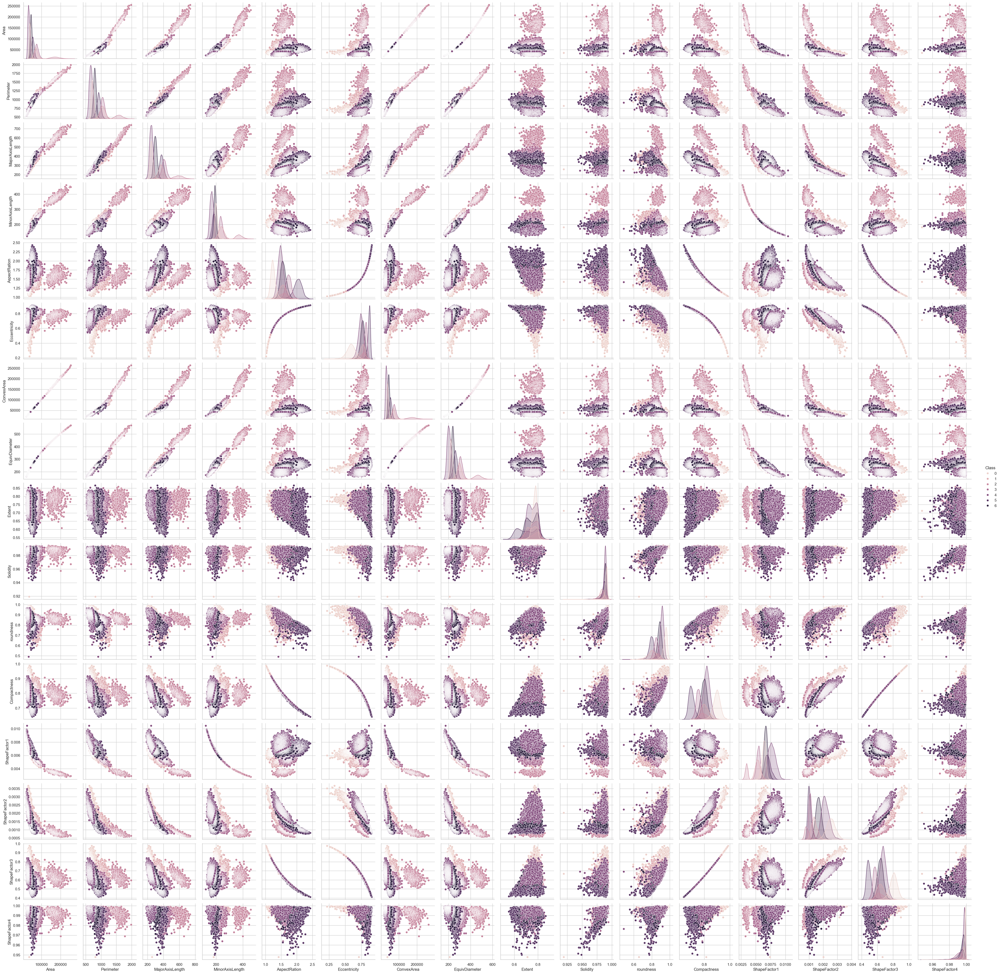

In [10]:
sns.set(style="whitegrid")
sns.pairplot(DBD, hue ='Class' )
plt.show()

**HISTOGRAM**

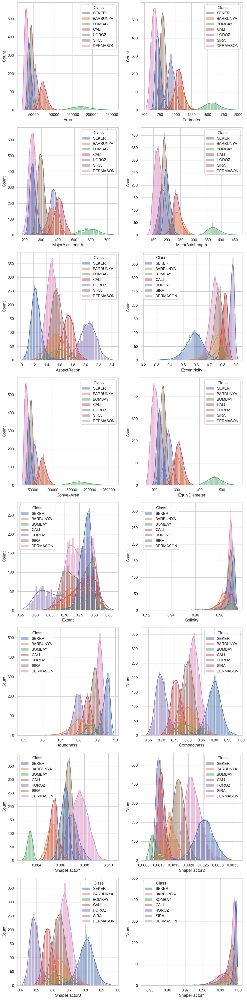

In [11]:
#  numerical columns
numerical_attributes = EDA_DBD.select_dtypes(include=[np.number]).columns.tolist()

# Calculating number of rows needed for the subplot grid
num_attributes = len(numerical_attributes)
num_rows = math.ceil(num_attributes / 2)

# Creating subplot grid 
fig, axs = plt.subplots(num_rows, 2, figsize=(10, num_rows * 5))  # Adjust figsize as needed

# Flattening axis array for easy iteration
axs = axs.flatten()

for i, attribute in enumerate(numerical_attributes):
    sns.histplot(data=EDA_DBD, x=attribute, kde=True,hue='Class',ax=axs[i])


if num_attributes % 2 != 0:
    axs[-1].axis('off')                #hiding the last subplot incase it is odd

#plot
plt.tight_layout()
plt.show()


**Box Plot**

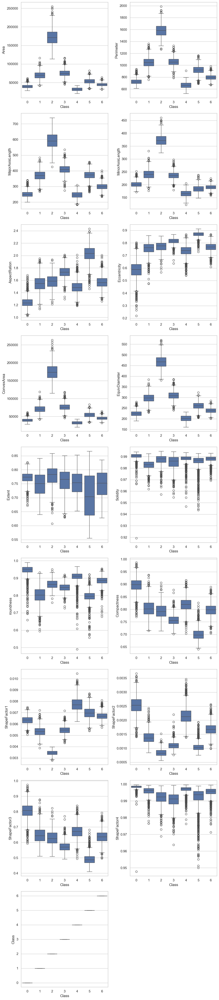

In [12]:
# Filter for numerical columns if your dataset contains non-numerical columns
numerical_attributes = DBD.select_dtypes(include=[np.number]).columns.tolist()

# Calculate the number of rows needed for the subplot grid
num_attributes = len(numerical_attributes)
num_rows = math.ceil(num_attributes / 2)

# Create a subplot grid with at most 2 columns
fig, axs = plt.subplots(num_rows, 2, figsize=(10, num_rows * 5))  # Adjust figsize as needed

# Flatten the axis array for easy iteration
axs = axs.flatten()

# Loop over each numerical attribute and plot a box plot on the corresponding axis
for i, attribute in enumerate(numerical_attributes):
    sns.boxplot(data=DBD, x='Class', y=attribute, ax=axs[i])

if num_attributes % 2 != 0:
    axs[-1].axis('off')

# plot
plt.tight_layout()
plt.show()


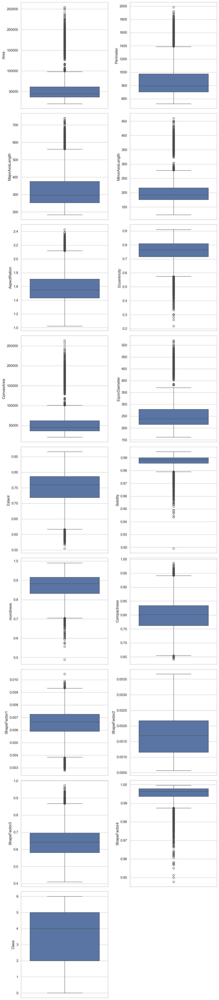

In [13]:
# numerical columns
numerical_attributes = DBD.select_dtypes(include=[np.number]).columns.tolist()

# Calculating the number of rows needed for the subplot grid
num_attributes = len(numerical_attributes)
num_rows = math.ceil(num_attributes / 2)

# Creating a subplot grid with at most 2 columns
fig, axs = plt.subplots(num_rows, 2, figsize=(10, num_rows * 5))  # Adjust figsize as needed

# Flatten the axis array for easy iteration
axs = axs.flatten()

# Looping over each numerical attribute and plot a box plot on the corresponding axis
for i, attribute in enumerate(numerical_attributes):
    sns.boxplot(data=DBD, y=attribute, ax=axs[i])

if num_attributes % 2 != 0:
    axs[-1].axis('off')

# plot
plt.tight_layout()
plt.show()


In [14]:
Target_Attribute = DBD['Class'].copy()

In [15]:
DBD1 = DBD.drop('Class', axis=1)

In [16]:
DBD1.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166


ModuleNotFoundError: No module named 'statsmodels'

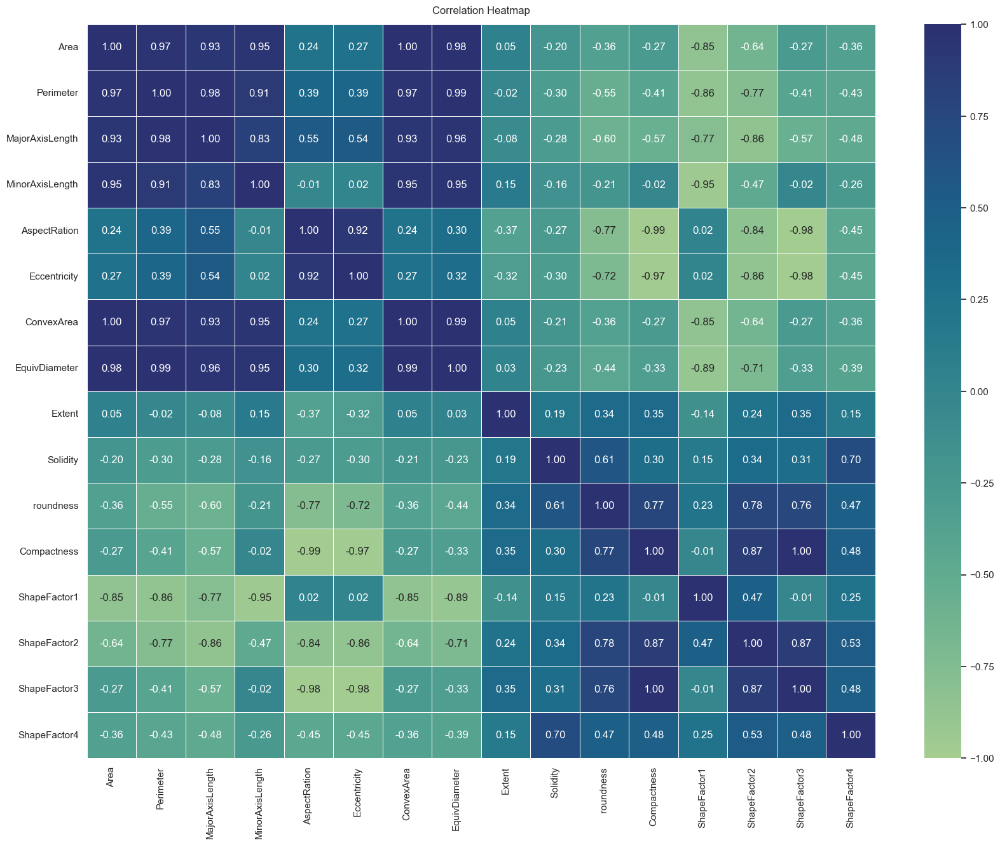

In [17]:
plt.figure(figsize=(20,15))
heatmap = sns.heatmap(DBD1.corr(), vmin=-1, vmax=1, annot=True, fmt=".2f", linewidth=.5, cmap="crest")
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)


#The VIF quantifies how much the variance of an estimated regression coefficient is increased due to multicollinearity. High VIF values (usually greater than 10) suggest multicollinearity

from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

X = add_constant(DBD1)  # Adding a constant (intercept) column
vif = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]


In [19]:
cor_pairs = []
for i in range(len(DBD1.columns)):
    for j in range(i + 1, len(DBD1.columns)):
        if abs(DBD1.iloc[i, j]) > 0.95:
            cor_pairs.append((DBD1.columns[i], DBD1.columns[j]))

In [20]:
print(cor_pairs)
len(cor_pairs)

[('Area', 'Perimeter'), ('Area', 'MajorAxisLength'), ('Area', 'MinorAxisLength'), ('Area', 'AspectRation'), ('Area', 'ConvexArea'), ('Area', 'EquivDiameter'), ('Area', 'Solidity'), ('Area', 'roundness'), ('Area', 'ShapeFactor4'), ('Perimeter', 'MajorAxisLength'), ('Perimeter', 'MinorAxisLength'), ('Perimeter', 'AspectRation'), ('Perimeter', 'ConvexArea'), ('Perimeter', 'EquivDiameter'), ('Perimeter', 'Solidity'), ('Perimeter', 'Compactness'), ('Perimeter', 'ShapeFactor4'), ('MajorAxisLength', 'MinorAxisLength'), ('MajorAxisLength', 'AspectRation'), ('MajorAxisLength', 'ConvexArea'), ('MajorAxisLength', 'EquivDiameter'), ('MajorAxisLength', 'Solidity'), ('MajorAxisLength', 'ShapeFactor4'), ('MinorAxisLength', 'AspectRation'), ('MinorAxisLength', 'ConvexArea'), ('MinorAxisLength', 'EquivDiameter'), ('MinorAxisLength', 'Solidity'), ('MinorAxisLength', 'ShapeFactor4'), ('AspectRation', 'ConvexArea'), ('AspectRation', 'EquivDiameter'), ('AspectRation', 'Solidity'), ('AspectRation', 'roundne

54

In [21]:
!pip install tabulate

In [22]:
from tabulate import tabulate
print(tabulate(cor_pairs))

---------------  ---------------
Area             Perimeter
Area             MajorAxisLength
Area             MinorAxisLength
Area             AspectRation
Area             ConvexArea
Area             EquivDiameter
Area             Solidity
Area             roundness
Area             ShapeFactor4
Perimeter        MajorAxisLength
Perimeter        MinorAxisLength
Perimeter        AspectRation
Perimeter        ConvexArea
Perimeter        EquivDiameter
Perimeter        Solidity
Perimeter        Compactness
Perimeter        ShapeFactor4
MajorAxisLength  MinorAxisLength
MajorAxisLength  AspectRation
MajorAxisLength  ConvexArea
MajorAxisLength  EquivDiameter
MajorAxisLength  Solidity
MajorAxisLength  ShapeFactor4
MinorAxisLength  AspectRation
MinorAxisLength  ConvexArea
MinorAxisLength  EquivDiameter
MinorAxisLength  Solidity
MinorAxisLength  ShapeFactor4
AspectRation     ConvexArea
AspectRation     EquivDiameter
AspectRation     Solidity
AspectRation     roundness
AspectRation     Compactnes

#### Removing Area and ShapeFactor4 - after looking at the correlation factors - and documentation of the dataset




In [23]:
DBD1.drop(['Area','ShapeFactor4'],axis=1,inplace=True)

In [24]:
DBD1.head()

,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3
0,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222
1,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851
2,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871
3,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794
4,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900


In [25]:
from sklearn.preprocessing import StandardScaler
# Re-initialize a standard scaler
standard_scaler = StandardScaler()

# Fitting the scaler to the features and transform
DBD1_standardized = standard_scaler.fit_transform(DBD1)

# DataFrame with the standardized features
df_standardized = pd.DataFrame(DBD1_standardized, columns=DBD1.columns)

df_standardized.head()

,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3
0,-1.143319,-1.306598,-0.631153,-1.565053,-2.185720,-0.841451,-1.063341,0.289087,0.367613,1.423867,1.839116,0.680786,2.402173,1.925723
1,-1.013924,-1.395911,-0.434445,-1.969784,-3.686040,-0.826102,-1.044217,0.697477,-0.462907,0.231054,2.495449,0.367967,3.100893,2.689702
2,-1.078829,-1.252357,-0.585735,-1.514291,-2.045336,-0.808704,-1.008084,0.578195,0.518417,1.252865,1.764843,0.603129,2.235091,1.841356
3,-0.977215,-1.278825,-0.439290,-1.741618,-2.742211,-0.773975,-0.973337,0.671260,-2.241767,0.515049,2.081715,0.401718,2.515075,2.204250
4,-1.097384,-1.380471,-0.266663,-2.117993,-4.535028,-0.784286,-0.966080,0.476020,0.804772,1.874992,2.765330,0.118268,3.270983,3.013462


# PCA

In [26]:
from prettytable import PrettyTable

# covariance matrix
cov_matrix = np.cov(df_standardized, rowvar=False)

# Calculating eigenvalues and eigenvectors
eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)

# Sorting eigenvalues and corresponding eigenvectors in descending order
sorted_indices = np.argsort(eigenvalues)[::-1]
eigenvalues = eigenvalues[sorted_indices]
eigenvectors = eigenvectors[:, sorted_indices]

# number of principal components
n_components = 7

# Projecting data onto the selected principal components
X_pca_custom = np.dot(df_standardized, eigenvectors[:, :n_components])

# Creating DataFrame with the PCA results
pca_columns_custom = ['PCA'+str(i+1) for i in range(n_components)]
X_pca_df_custom = pd.DataFrame(data=X_pca_custom, columns=pca_columns_custom)

print("PCA Results without scikit-learn PCA: \n ---------------------------------------------------------------------------------------------- \n")
print(X_pca_df_custom.head())

# explained variance ratio calculation
explained_variance_ratio_custom = eigenvalues / np.sum(eigenvalues)

#explained variance ratio for each principal component
print("\n ---------------------------------------------------------------------------------------------- \n Explained Variance Ratio without scikit-learn PCA: ")
print(explained_variance_ratio_custom)

#table for explained variance ratios
table_custom = PrettyTable()
table_custom.field_names = ['Principal Component', 'Explained Variance', 'Cumulative Explained Variance']

cumulative_explained_variance_custom = np.cumsum(explained_variance_ratio_custom)
for i, (explained_variance, cumulative_explained_variance) in enumerate(zip(explained_variance_ratio_custom, cumulative_explained_variance_custom), 1):
    table_custom.add_row([f'PC{i}', f'{explained_variance:.4f}', f'{cumulative_explained_variance:.4f}'])

# table
print("\n ---------------------------------------------------------------------------------------------- \n Explained Variance Table without scikit-learn PCA:")
print(table_custom)


PCA Results without scikit-learn PCA: 
 ---------------------------------------------------------------------------------------------- 

       PCA1      PCA2      PCA3      PCA4      PCA5      PCA6      PCA7
0  4.976637 -1.480737  0.688627  0.216352 -0.037649  0.575154 -0.420869
1  5.552853 -2.605467  2.207204 -0.409166  1.101277  1.322335 -0.816922
2  4.729944 -1.491821  0.440480 -0.012567  0.135167  0.550394 -0.314075
3  4.532402 -1.867148  3.148563 -1.160346 -0.090065  0.635124 -0.759089
4  6.556019 -3.642310  1.034162  0.638663  0.645782  1.021507 -1.515313

 ---------------------------------------------------------------------------------------------- 
 Explained Variance Ratio without scikit-learn PCA: 
[5.62146401e-01 2.79789266e-01 7.30985375e-02 5.50053701e-02
 1.55029914e-02 8.56408847e-03 5.09864394e-03 5.89191798e-04
 9.68993879e-05 7.32204449e-05 2.24181903e-05 1.07111752e-05
 2.09472880e-06 1.65941654e-07]

 ---------------------------------------------------------------

In [28]:
#X_pca_df_custom.drop(['PCA8','PCA9','PCA10','PCA11','PCA12','PCA13','PCA14'], axis=1, inplace=True)

print("PCA Results after dropping components:")
print(X_pca_df_custom.head())

PCA Results after dropping components:
       PCA1      PCA2      PCA3      PCA4      PCA5      PCA6      PCA7
0  4.976637 -1.480737  0.688627  0.216352 -0.037649  0.575154 -0.420869
1  5.552853 -2.605467  2.207204 -0.409166  1.101277  1.322335 -0.816922
2  4.729944 -1.491821  0.440480 -0.012567  0.135167  0.550394 -0.314075
3  4.532402 -1.867148  3.148563 -1.160346 -0.090065  0.635124 -0.759089
4  6.556019 -3.642310  1.034162  0.638663  0.645782  1.021507 -1.515313


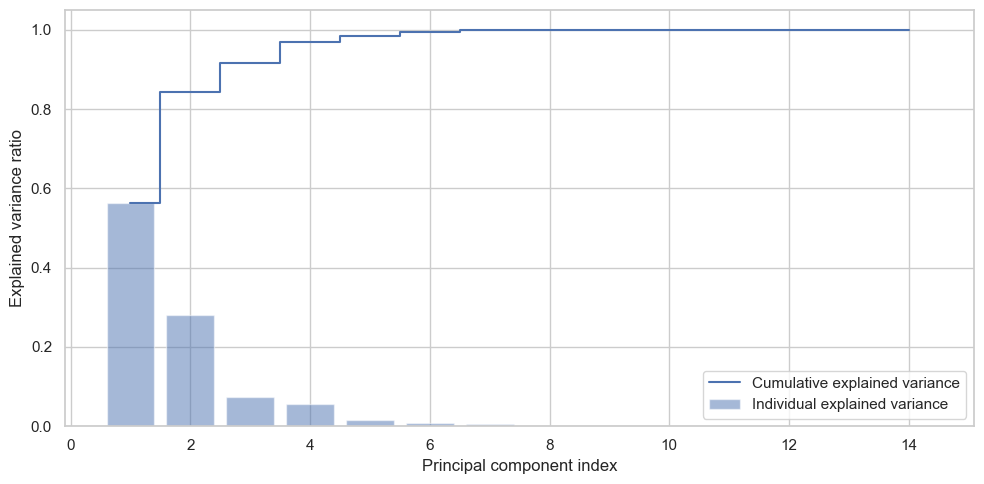

In [29]:
# Plot the explained variance
plt.figure(figsize=(10, 5))
plt.bar(range(1, len(explained_variance_ratio_custom)+1), explained_variance_ratio_custom, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(1, len(explained_variance_ratio_custom)+1), np.cumsum(explained_variance_ratio_custom), where='mid', label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()


In [30]:
#Copying the table after Pre processing into a Dataframe called Final Table F_Table
F_Table = X_pca_df_custom.copy()
F_Table

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7
0,4.976637,-1.480737,0.688627,0.216352,-0.037649,0.575154,-0.420869
1,5.552853,-2.605467,2.207204,-0.409166,1.101277,1.322335,-0.816922
2,4.729944,-1.491821,0.440480,-0.012567,0.135167,0.550394,-0.314075
3,4.532402,-1.867148,3.148563,-1.160346,-0.090065,0.635124,-0.759089
4,6.556019,-3.642310,1.034162,0.638663,0.645782,1.021507,-1.515313
...,...,...,...,...,...,...,...
13606,0.890481,0.559572,-0.477654,0.894461,-0.290362,-0.366257,0.098001
13607,1.462603,-0.363093,-0.979938,-0.539805,-0.048244,-0.288854,0.086542
13608,1.317018,-0.044068,-0.278436,0.660410,-0.165853,-0.337678,0.110014
13609,1.055822,0.251991,0.261530,0.890680,-0.277351,-0.356229,0.101914


In [31]:
#Splitting the Data into Train and Test Set
Target_Attribute = Target_Attribute.astype(float)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(F_Table, Target_Attribute, test_size=0.33, random_state=42)

In [32]:
X_train.head()

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7
9480,-0.740471,1.230216,0.324043,0.698589,-0.251305,-0.343392,0.030113
6775,-1.703717,0.758182,-1.546208,-1.167519,0.471707,-0.069521,0.001832
5766,-2.702099,4.074202,0.703704,1.626934,0.408780,0.476011,-0.151927
227,4.421840,-2.257510,0.555073,0.534784,0.298894,0.296612,-0.464823
7113,-3.310736,1.949490,-1.334080,-1.741801,0.507284,0.267481,-0.458164


In [33]:
y_train.head()

9480    6.0
6775    5.0
5766    5.0
227     0.0
7113    5.0
Name: Class, dtype: float64

In [34]:
y_train = y_train.astype(int)

In [35]:
y_test.head()

1488     0.0
2611     1.0
749      0.0
99       0.0
11298    4.0
Name: Class, dtype: float64

In [36]:
y_test = y_test.astype(int)

# LOGISTIC REGRESSION

In [37]:
class LogisticRegressionOneVsRest:
    def __init__(self, num_classes, learning_rate=0.1, iterations=1000):
        self.num_classes = num_classes
        self.learning_rate = learning_rate
        self.iterations = iterations
        self.classifiers = {}
        self.cost_history = {}

    #calcluating the sigmoid function
    def sigmoid(self, z):
        return 1 / (1 + np.exp(-z))

    #calculating the logistic regression cost
    def compute_cost(self, X, y, theta):
        m = len(y)
        h = self.sigmoid(np.dot(X, theta))
        epsilon = 1e-5  # small value to prevent log(0)
        cost = (1 / m) * np.sum(-y * np.log(h + epsilon) - (1 - y) * np.log(1 - h + epsilon))
        return cost

    #calculating the gradient descent to reduce the cost function
    def gradient_descent(self, X, y, theta, class_label):
        m = len(y)
        cost_history = []

        for i in range(self.iterations):
            h = self.sigmoid(np.dot(X, theta))
            gradient = np.dot(X.T, (h - y)) / m
            theta -= self.learning_rate * gradient
            cost = self.compute_cost(X, y, theta)
            cost_history.append(cost)

        self.cost_history[class_label] = cost_history
        return theta

    #fitting the regression model to our 7 classes
    def fit(self, X_train, y_train):
        intercept_train = np.ones((X_train.shape[0], 1))
        X_train = np.hstack((intercept_train, X_train))

        for class_label in range(self.num_classes):
            y_train_class = (y_train == class_label).astype(int)
            theta = np.zeros(X_train.shape[1])
            theta = self.gradient_descent(X_train, y_train_class, theta, class_label)
            self.classifiers[class_label] = theta

    #after fitting the model, using X_test dataset to predict the classes
    def predict(self, X_test):
        intercept_test = np.ones((X_test.shape[0], 1))
        X_test = np.hstack((intercept_test, X_test))

        scores = np.zeros((X_test.shape[0], self.num_classes))

        for idx, theta in self.classifiers.items():
            scores[:, idx] = self.sigmoid(np.dot(X_test, theta))

        return np.argmax(scores, axis=1)

    #visualizing the graph of the cost function
    def plot_cost_history(self):
        plt.figure(figsize=(10, 6))
        for class_label, cost_history in self.cost_history.items():
            plt.plot(cost_history, label=f"Class {class_label}")
        plt.xlabel('Iterations')
        plt.ylabel('Cost')
        plt.title('Cost vs. Iterations for each class')
        plt.legend()
        plt.show()

    def accuracy(self, y_true, y_pred):
        return np.mean(y_true == y_pred)

    def train_test_accuracy(self, X_train, y_train, X_test, y_test):
        self.fit(X_train, y_train)

        y_train_pred = self.predict(X_train)
        train_accuracy = self.accuracy(y_train, y_train_pred)
        y_test_pred = self.predict(X_test)
        test_accuracy = self.accuracy(y_test, y_test_pred)

        return train_accuracy, test_accuracy

    def plot_cost(self, cost_sequence):
        # Data for plotting
        #s = np.array(cost_sequence)
        t = np.arange(len(cost_sequence))
        #t = np.arange(s.size)

        fig, ax = plt.subplots()
        ax.plot(t, cost_sequence)

        ax.set(xlabel = 'Iterations', ylabel = 'Cost', title = 'Cost Trend')
        ax.grid()

        plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, shadow = True)
        plt.show()

model = LogisticRegressionOneVsRest(num_classes=7)

train_acc, test_acc = model.train_test_accuracy(X_train, y_train, X_test, y_test)

print(f"The Training Accuracy: {train_acc:.4f}")
print(f"The Testing Accuracy: {test_acc:.4f}")


The Training Accuracy: 0.8972
The Testing Accuracy: 0.8996


In [38]:
model.fit(X_train, y_train)

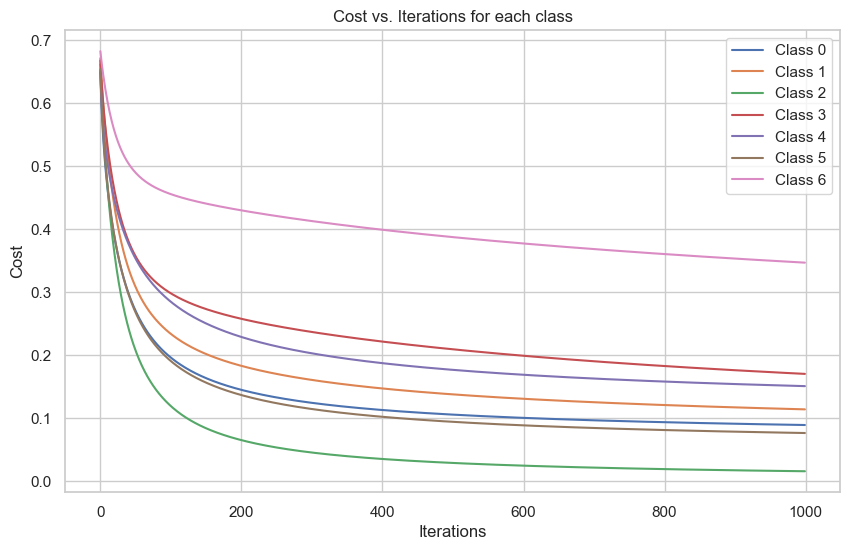

In [39]:
model.plot_cost_history()

In [40]:
predictions = model.predict(X_test)

In [41]:
accuracy = np.mean(predictions == y_test) * 100
print(f"Accuracy on the test set: {accuracy:.2f}%")

Accuracy on the test set: 89.96%


In [43]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

model = LogisticRegressionOneVsRest(num_classes=7)

train_acc, test_acc = model.train_test_accuracy(X_train, y_train, X_test, y_test)
y_test_pred = model.predict(X_test)

precision_7 = precision_score(y_test, y_test_pred, average=None)
recall_7 = recall_score(y_test, y_test_pred, average=None)
f1_7 = f1_score(y_test, y_test_pred, average=None)

precision = precision_score(y_test, y_test_pred, average='macro')

recall_7 = recall_score(y_test, y_test_pred, average='macro')

f1_7 = f1_score(y_test, y_test_pred, average='macro')

# Print the results
print(f'Precision per class: {precision_7}')
print(f'Recall per class: {recall_7}')
print(f'F1 Score per class: {f1_7}')

print(f'Precision (Macro): {precision}')

print(f'Recall (Macro): {recall_7}')

print(f'F1 Score (Macro): {f1_7}')

# Additionally, you can print accuracy for reference
accuracy = accuracy_score(y_test, y_test_pred)
print(f'Accuracy: {accuracy}')


Precision per class: [0.94615385 0.93382353 1.         0.90352505 0.879468   0.94620253
 0.82106455]
Recall per class: 0.909674899234534
F1 Score per class: 0.9137484586512084
Precision (Macro): 0.9186053575613901
Recall (Macro): 0.909674899234534
F1 Score (Macro): 0.9137484586512084
Accuracy: 0.8995992876224399


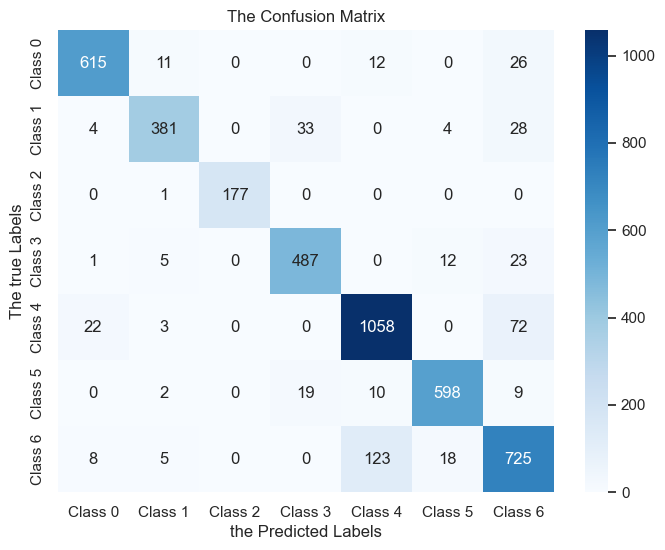

In [44]:
def the_confusion_matrix(conf_matrix, num_classes):
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
                xticklabels=[f'Class {i}' for i in range(num_classes)],
                yticklabels=[f'Class {i}' for i in range(num_classes)])
    plt.xlabel('the Predicted Labels')
    plt.ylabel('The true Labels')
    plt.title('The Confusion Matrix')
    plt.show()

def confusion_matrix_calculation(y_true, y_pred, num_classes):

    conf_matrix = np.zeros((num_classes, num_classes), dtype=int)

    for true_label, pred_label in zip(y_true.astype(int), y_pred.astype(int)):
        conf_matrix[true_label, pred_label] += 1

    return conf_matrix

y_pred = model.predict(X_test)
conf_matrix = confusion_matrix_calculation(y_test, y_pred, model.num_classes)
the_confusion_matrix(conf_matrix, model.num_classes)


The above confusion matrix shows the correct classification of the classes and the incorrect/ misclassified classifications by our model. Dark blue indicates higher number of correct classification of the classes. Vertical line indicate the true labels while the horizontal line indicates predicted labels.

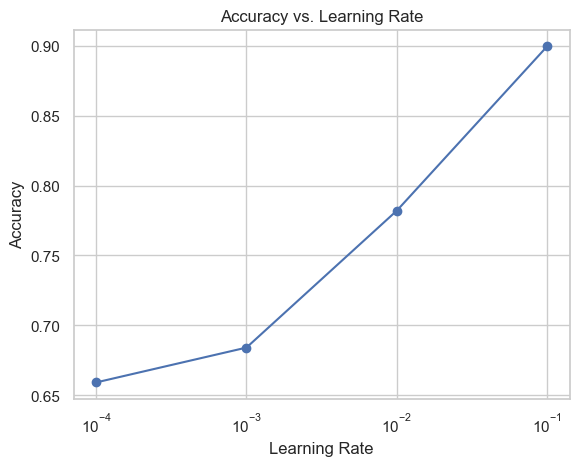

In [45]:
# training the model with diff learning rates
def train_model_with_lr(X_train, y_train, learning_rate):
    model = LogisticRegressionOneVsRest(num_classes=7, learning_rate=learning_rate)
    model.fit(X_train, y_train)
    return model

# evaluation of model and calculation of accuracy
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    accuracy = np.mean(y_pred == y_test)
    return accuracy

learning_rates = [0.1, 0.01, 0.001, 0.0001]

accuracy_results = []

for learning_rate in learning_rates:
    trained_model = train_model_with_lr(X_train, y_train, learning_rate)
    accuracy = evaluate_model(trained_model, X_test, y_test)
    accuracy_results.append(accuracy)

# Plotting Results for learning rate vs accuracy
plt.plot(learning_rates, accuracy_results, marker='o')
plt.xscale('log')  # Using log scale for learning rates if they vary widely
plt.xlabel('Learning Rate')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Learning Rate')
plt.show()


# SOFT MARGIN SVM

In [49]:
X_train, X_test, y_train, y_test = train_test_split(F_Table, Target_Attribute, test_size=0.33, random_state=42)

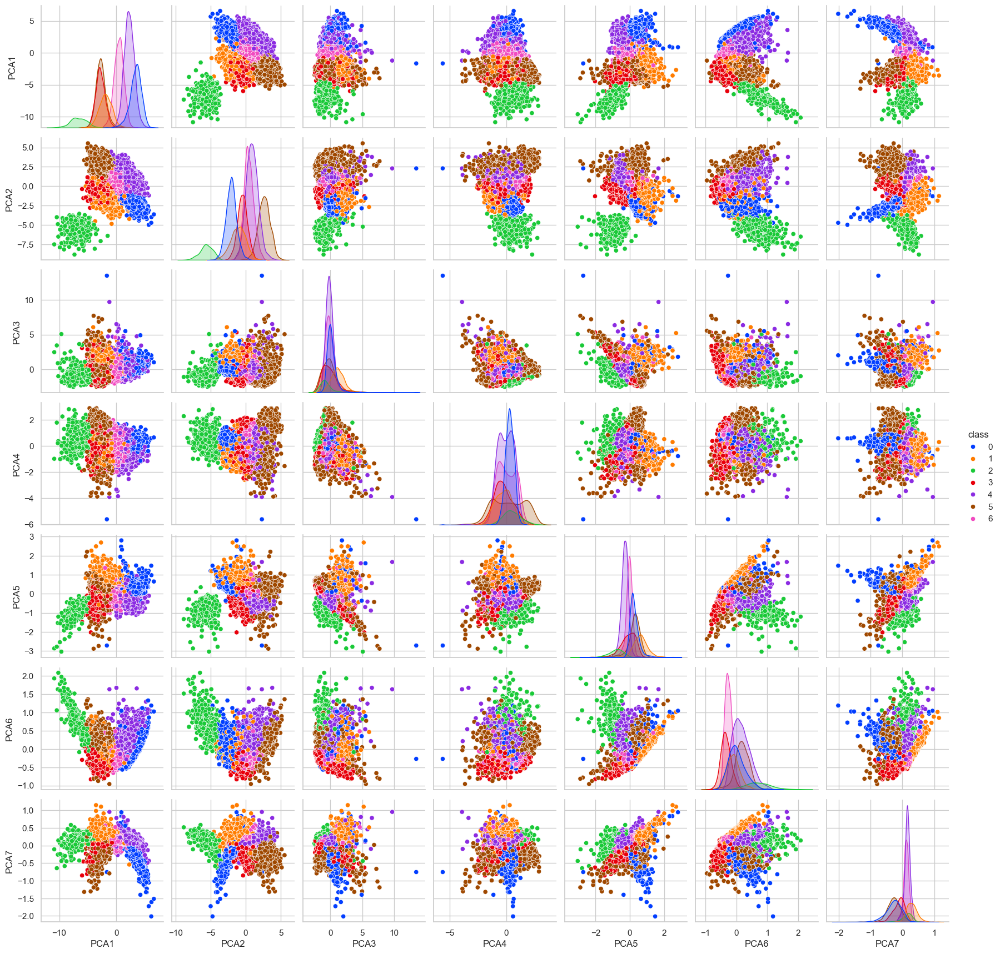

In [46]:
#plotting Pairplot of PCA values to check linearity of the data
dfp= X_train
dfp['class'] = y_train
sns.pairplot(dfp, hue='class', palette='bright')
plt.show()

In [50]:
import numpy as np
from tqdm import tqdm

class BinarySVM:
    def __init__(self, C=1.0, lr=0.001, n_iter=1000):
        # Constructor to initialize the SVM parameters
        self.C = C       # Regularization parameter
        self.lr = lr     # Learning rate
        self.n_iter = n_iter # Number of iterations for training
        self.w = None    # Weight vector, to be initialized later

    def fit(self, X, y):
        # Fit the SVM model to the training data
        n_samples, n_features = X.shape   # Get the number of samples and features
        y_ = np.where(y <= 0, -1, 1)      # Convert target values to -1 and 1
        self.w = np.zeros(n_features)     # Initialize weights to zeros
        self.b = 0                        # Initialize bias term to zero

        # Gradient descent for optimization
        for _ in tqdm(range(self.n_iter), desc='Iteration'):
            for idx in range(len(X)):
                x_i = X.iloc[idx].values  # Extract each sample
                dot_product = np.matmul(x_i, self.w) # Compute the dot product
                condition = (y_[idx] * (dot_product + self.b)) >= 1 # Check the condition for hinge loss
                # Update weights and bias
                if condition:
                    self.w -= self.lr * 2 * self.C * self.w
                else:
                    self.w -= self.lr * (2 * self.C * self.w - np.dot(x_i, y_[idx]))
                    self.b -= self.lr * -y_[idx]

    def predict(self, X):
        # Predict the class labels for the input data
        return np.dot(X, self.w) - self.b

class MultiClassSVM:
    def __init__(self, C=1.0, lr=0.01, n_iter=1000):
        # Constructor to initialize the multi-class SVM parameters
        self.C = C
        self.lr = lr
        self.n_iter = n_iter
        self.classifiers = [] # List of binary SVM classifiers for each class

    def fit(self, X, y):
        # Fit the multi-class SVM model to the training data
        self.classes = np.unique(y)  # Get the unique classes
        X.columns = range(X.shape[1]) # Reset column names if using pandas DataFrame

        # Train a binary SVM for each class (One-vs-Rest approach)
        for c in self.classes:
            y_binary = np.where(y == c, 1, -1)  # Create binary target for current class
            svm = BinarySVM(self.C, self.lr, self.n_iter)
            svm.fit(X, y_binary)
            self.classifiers.append(svm) # Append the trained classifier

    def predict(self, X):
        # Predict the class labels for the input data
        predictions = np.array([svm.predict(X) for svm in self.classifiers]).T
        return self.classes[np.argmax(predictions, axis=1)] # Return the class with the highest score


In [51]:
model = MultiClassSVM(C=10, lr=0.001, n_iter=100)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)  # predictions for test set

Iteration: 100%|██████████████████████████████████████████████████████████████████████████████████| 100/100 [01:46<00:00,  1.06s/it]


In [52]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"Accuracy: {accuracy}")

print(f"Precision: {precision}")

print(f"Recall: {recall}")

print(f"F1 Score: {f1}")

Accuracy: 0.5211487088156723
Precision: 0.4562346260124676
Recall: 0.5211487088156723
F1 Score: 0.4740580961108161


C:\Users\Utkarsh Singh\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.metrics import mean_squared_error
learning_rates = [0.0001, 0.001, 0.005]

combined_errors = []

for rate in learning_rates:
    print("Learning rate:", rate)
    classifier = MultiClassSVM(lr=rate, C=1, n_iter=100)
    classifier.fit(X_train, y_train)
    predictions_train = classifier.predict(X_train)
    predictions_test = classifier.predict(X_test)
    error_train = mean_squared_error(y_train, predictions_train)
    error_test = mean_squared_error(y_test, predictions_test)
    combined_error = error_train + error_test
    combined_errors.append(combined_error)

#plot to display error vs Learning Rate
plt.figure(figsize=(10, 6))
plt.plot(learning_rates, combined_errors, marker='o')
plt.xlabel('Learning Rates')
plt.ylabel('Sum of Training and Test Errors')
plt.title('Performance Analysis')
plt.xticks(learning_rates)
plt.grid(True)
plt.show()


Learning rate: 0.0001


Iteration: 100%|██████████████████████████████████████████████████████████████████████████████████| 100/100 [01:05<00:00,  1.53it/s]


Learning rate: 0.001


Iteration: 100%|██████████████████████████████████████████████████████████████████████████████████| 100/100 [00:21<00:00,  4.68it/s]


Learning rate: 0.005


Iteration:  36%|█████████████████████████████▉                                                     | 36/100 [00:08<00:14,  4.31it/s]

# NEURAL NET

In [54]:
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score

# Defining number of classes and input dimension
n_classes = y_train.nunique() # Assuming target class is encoded as integers
input_dim = X_train.shape[1]

# Build the neural network
nnm = Sequential()                                                         #building a sequential neural network model(nnm)
nnm.add(Dense(50, activation="relu", input_shape=(input_dim,)))            #adding dense layer of 50 neurons and ReLU activation
nnm.add(Dropout(0.2))                                                      #helps to randomly drop neurons training so as to prevent overfitting
nnm.add(Dense(30, activation="relu"))                                      #adding dense layer of 30 neurons and ReLU activation
nnm.add(Dropout(0.2))                                                      #dropping neurons by probability of 0.2
nnm.add(Dense(n_classes, activation="softmax"))                            #final output layer with n_classes neurons and softmax activation for multi-class classification

# model compilation using Using Adam as optimizer for efficient gradient descent
# using loss function sparse_categorical_crossentropy for multi classification
# defining accuracy as the metrics to be tracked while compilation of model
nnm.compile(loss="sparse_categorical_crossentropy", optimizer="adam", metrics=["accuracy"])

# model Training
history = nnm.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

#model.fit(X_train, y_train, epochs=100, batch_size=32)                        # 32 samples per iteration

# model evaluation
loss, accuracy = nnm.evaluate(X_test, y_test)
print("Test loss:", loss)
print("Test accuracy:", accuracy)

# Predict classes on the test set
y_pred = nnm.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)                                  # eturns the index of the highest probability for each sample.

# Calculate precision, recall, and F1 score
precision = precision_score(y_test, y_pred_classes, average='weighted')
recall = recall_score(y_test, y_pred_classes, average='weighted')
f1 = f1_score(y_test, y_pred_classes, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Optionally, print a detailed classification report
print(classification_report(y_test, y_pred_classes))

# Save the model (optional)
nnm.save("dry_bean_classifier.h5")





Epoch 1/10


285/285 [==============================] - 6s 10ms/step - loss: 0.9166 - accuracy: 0.6843 - val_loss: 0.3627 - val_accuracy: 0.8978
Epoch 2/10
285/285 [==============================] - 3s 9ms/step - loss: 0.4155 - accuracy: 0.8617 - val_loss: 0.2678 - val_accuracy: 0.9074
Epoch 3/10
285/285 [==============================] - 3s 9ms/step - loss: 0.3447 - accuracy: 0.8823 - val_loss: 0.2427 - val_accuracy: 0.9121
Epoch 4/10
285/285 [==============================] - 3s 9ms/step - loss: 0.3139 - accuracy: 0.8945 - val_loss: 0.2306 - val_accuracy: 0.9163
Epoch 5/10
285/285 [==============================] - 3s 9ms/step - loss: 0.2980 - accuracy: 0.8993 - val_loss: 0.2274 - val_accuracy: 0.9154
Epoch 6/10
285/285 [==============================] - 3s 9ms/step - loss: 0.2950 - accuracy: 0.8989 - val_loss: 0.2204 - val_accuracy: 0.9194
Epoch 7/10
285/285 [==============================] - 3s 9ms/step - loss: 0.2836 - accuracy: 0.9012 - val_loss: 0.2202 - val_accuracy: 0.9212


C:\Users\Utkarsh Singh\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [55]:
nnm.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 50)                400       
                                                                 
 dropout (Dropout)           (None, 50)                0         
                                                                 
 dense_1 (Dense)             (None, 30)                1530      
                                                                 
 dropout_1 (Dropout)         (None, 30)                0         
                                                                 
 dense_2 (Dense)             (None, 7)                 217       
                                                                 
Total params: 2147 (8.39 KB)
Trainable params: 2147 (8.39 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [56]:
!pip install pydot
!pip install graphviz

In [57]:
#Screenshot or Plot of Our Model

from tensorflow.keras.utils import plot_model
plot_model(nnm, to_file='model.png', show_shapes=True, show_layer_names=True)


You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


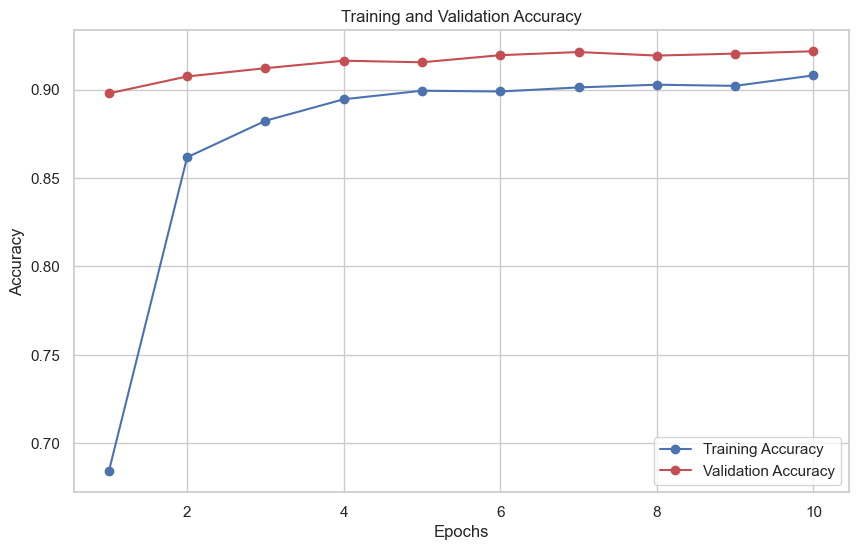

In [58]:
import matplotlib.pyplot as plt

# Extracting accuracy values for each epoch
training_accuracy = history.history['accuracy']
validation_accuracy = history.history['val_accuracy']
epochs = range(1, len(training_accuracy) + 1)

# Plotting the accuracy graph
plt.figure(figsize=(10, 6))
plt.plot(epochs, training_accuracy, 'bo-', label='Training Accuracy')
plt.plot(epochs, validation_accuracy, 'ro-', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()


141/141 [==============================] - 1s 6ms/step


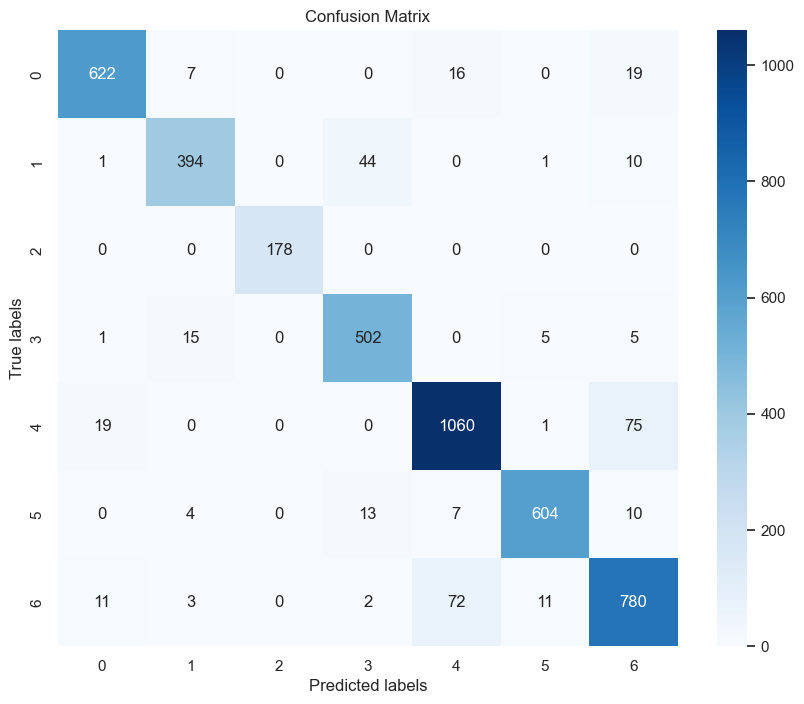

In [59]:
# Generate predictions
y_pred_prob = nnm.predict(X_test)
y_pred_classes = np.argmax(y_pred_prob, axis=1)

from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Create confusion matrix
cm = confusion_matrix(y_test, y_pred_classes)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()
